In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np
# from scipy.interpolate import CubicSpline
from scipy.interpolate import CubicSpline
from matplotlib.ticker import ScalarFormatter
from matplotlib import pyplot as plt
from tqdm import tqdm
# from numba import njit, jit
import json

import sys
sys.path.append("./../src")
import scripts as plot_scripts  # plotting functions
plot_scripts.setup_rc_params()


# path_to_exact_data = "./../TOV_data/Quarkies/"
# path_to_emulated_data = "./../testData/"

# path_to_exact_data = "./../testData/"
# path_to_emulated_data = "./../Results/Quarkies/"
path_to_data = "./../testData/"
# path_to_SLM_data = "./../Results/QEOS/"

In [3]:
# define some useful figure things
dpi = 1200
figsize = (7, 5)
save_figures = True
save_location = "./../Plots"

tov_alpha = 0.8
dmd_alpha = 0.6
res_alpha = 0.6
# tov_alpha = 1.0
# dmd_alpha = 0.4
# res_alpha = 0.3
scatter_size = 20
tick_size = 24
axis_label_size = 24
res_axis_label_size = 18
tov_linewidth = 2
dmd_dot_size = 30
res_linewidth = 3
title_size = 24

legend_size = 15.47

res_width = "49%"
res_height = 2.3

In [4]:
exact_solutions = []
emulated_solutions = []
# train_parameters = []
# test_parameters = []
parameters = []

for file in sorted(os.listdir(path_to_data)):
    # print(file)
    
    # exact data
    if file[-4:] == ".txt":
        if "MR_" in file:
            file_parameters = file.strip(".txt").split("_")[2:4]
            parameters.append(file_parameters[::-1])
            # print(f"{path_to_data}{file}")
            data = np.loadtxt(f"{path_to_data}{file}").T  # load the data)
            exact_solutions.append(data)
    
    # emulated data
    if file[-4:] == ".dat":
        if "SLM_" in file:
            file_parameters = file.strip(".dat").split("_")[1:3]
            # parameters.append(file_parameters)
            # print(f"{path_to_data}{file}")
            SLM_data = np.loadtxt(f"{path_to_data}{file}")  # load the data)
            emulated_solutions.append(SLM_data)
            # with open(f"{path_to_data}{file}", "r") as f:
            #     print(f)
            #     SLM_data = json.load(f)["Xdmd"]
            #     emulated_solutions.append(SLM_data)

parameters

[['310.53', '0.10'],
 ['321.05', '0.10'],
 ['342.11', '0.10'],
 ['352.63', '0.10'],
 ['373.68', '0.10'],
 ['384.21', '0.10'],
 ['405.26', '0.10'],
 ['415.79', '0.10'],
 ['436.84', '0.10'],
 ['447.37', '0.10'],
 ['468.42', '0.10'],
 ['478.95', '0.10'],
 ['500.00', '0.10'],
 ['300.00', '0.12'],
 ['321.05', '0.12'],
 ['331.58', '0.12'],
 ['352.63', '0.12'],
 ['363.16', '0.12'],
 ['384.21', '0.12'],
 ['394.74', '0.12'],
 ['415.79', '0.12'],
 ['426.32', '0.12'],
 ['447.37', '0.12'],
 ['457.89', '0.12'],
 ['478.95', '0.12'],
 ['489.47', '0.12'],
 ['300.00', '0.14'],
 ['310.53', '0.14'],
 ['331.58', '0.14'],
 ['342.11', '0.14'],
 ['363.16', '0.14'],
 ['373.68', '0.14'],
 ['394.74', '0.14'],
 ['405.26', '0.14'],
 ['426.32', '0.14'],
 ['436.84', '0.14'],
 ['457.89', '0.14'],
 ['468.42', '0.14'],
 ['489.47', '0.14'],
 ['500.00', '0.14'],
 ['310.53', '0.17'],
 ['321.05', '0.17'],
 ['342.11', '0.17'],
 ['352.63', '0.17'],
 ['373.68', '0.17'],
 ['384.21', '0.17'],
 ['405.26', '0.17'],
 ['415.79', '

In [5]:
len(parameters)

133

In [6]:
# lines = [11, 14, 16, 17, 25, 33, 47, 50, 53, 54, 55, 69, 72, 88, 93, 101, 104, 107, 109, 123, 126, 129, 134, 137, 140, 145, 150, 159, 162, 164, 173, 178, 181]  # 146
lines = [0, 4, 6, 8, 14, 16, 18, 32, 34, 36, 40, 44, 48, 50, 66, 79, 103, 106, 115, 119, 130, 132]

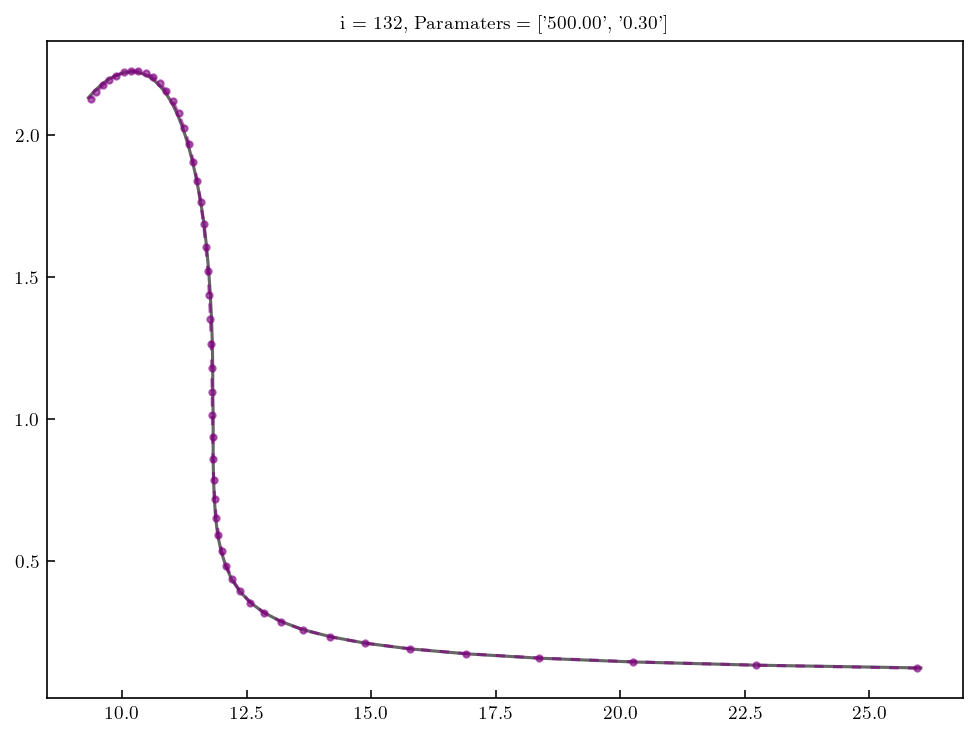

In [7]:
i = 132

if (len(exact_solutions[i][0]) == 50) and (len(emulated_solutions[i][0]) == 50):
    plt.title(f"i = {i}, Paramaters = {parameters[i]}")
    # for i in lines:
    plt.plot(exact_solutions[i][0], exact_solutions[i][2], color="black", alpha=0.6)
    plt.plot(emulated_solutions[i][0], emulated_solutions[i][2], marker=".", linestyle=(0, (3, 3)), alpha=0.6, color="purple")
    # plt.axvline(12.5, color="black")
    plt.show()
else:
    print(len(exact_solutions[i][0]), len(emulated_solutions[i][0]))

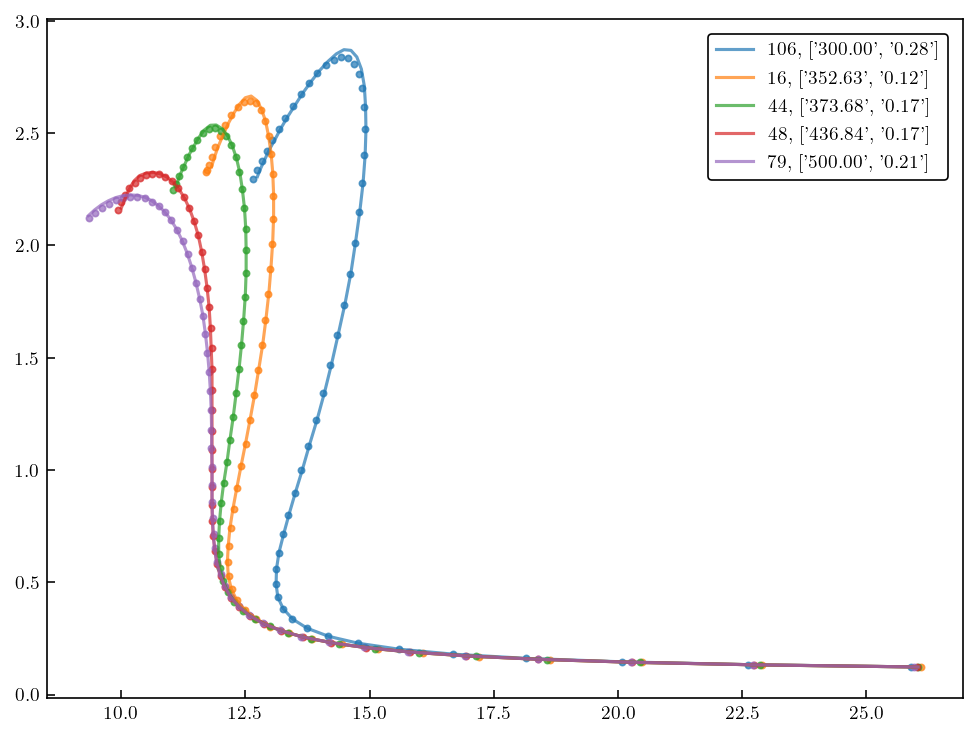

In [8]:
# lines = [0, 4, 6, 8, 14, 16, 18, 32, 34, 36, 40, 44, 48, 50, 66, 79, 103, 106, 115, 119, 130, 132]
# lines = [0, 4, 6, 8, 14, 16, 18, 32, 34, 36, 40, 44, 48, 50, 66, 79, 103, 106, 115, 119, 130, 132]
# lines = [0, 8, 16, 44, 48, 79, 106, 132]
lines = [16, 44, 48, 79, 106]
lines = [106, 16, 44, 48, 79]
# lines = [132, 79]

q = 1
for i in lines:
    if (len(exact_solutions[i][0]) == 50) and (len(emulated_solutions[i][0]) == 50):
        q += 1
        plt.plot(exact_solutions[i][0], exact_solutions[i][2], label=f"{i}, {parameters[i]}", alpha=0.7)
        plt.scatter(emulated_solutions[i][0], emulated_solutions[i][2], marker=".", alpha=0.7)
    else:
        print(f"i={i} doesn't work!")
plt.legend()
plt.show()

[16, 44, 48, 79, 106]


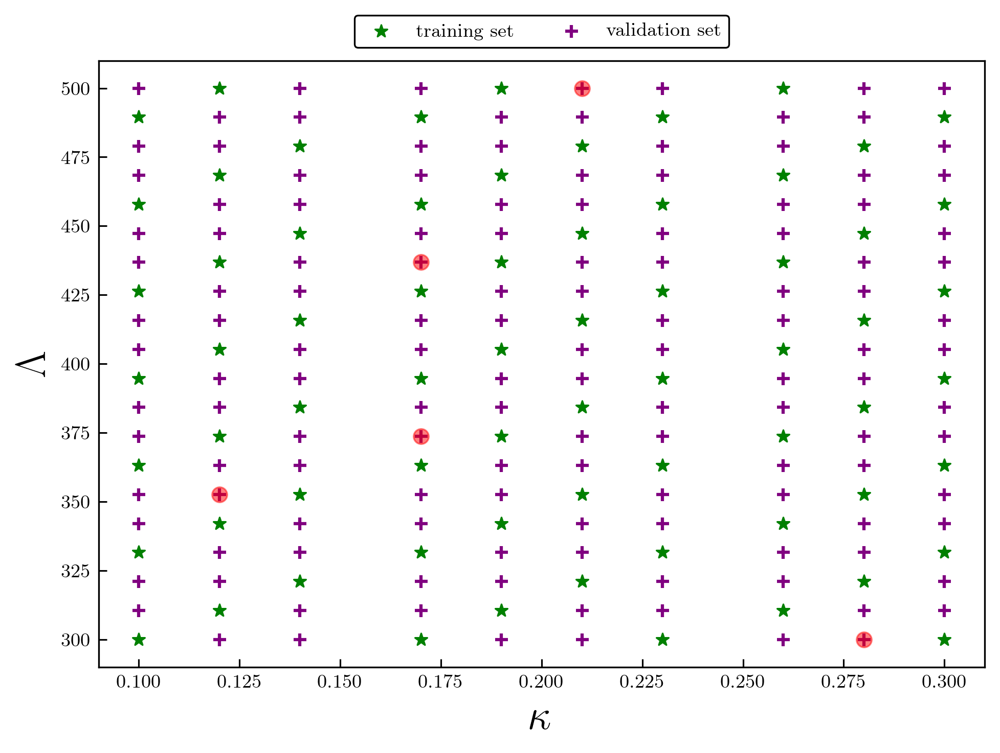

In [9]:
# these come from the print statement in pSLM.py
training_set = ['MR_Quarkyonia_0.10_300.00.txt', 'MR_Quarkyonia_0.10_331.58.txt', 'MR_Quarkyonia_0.10_363.16.txt', 'MR_Quarkyonia_0.10_394.74.txt', 'MR_Quarkyonia_0.10_426.32.txt', 'MR_Quarkyonia_0.10_457.89.txt', 'MR_Quarkyonia_0.10_489.47.txt', 'MR_Quarkyonia_0.12_310.53.txt', 'MR_Quarkyonia_0.12_342.11.txt', 'MR_Quarkyonia_0.12_373.68.txt', 'MR_Quarkyonia_0.12_405.26.txt', 'MR_Quarkyonia_0.12_436.84.txt', 'MR_Quarkyonia_0.12_468.42.txt', 'MR_Quarkyonia_0.12_500.00.txt', 'MR_Quarkyonia_0.14_321.05.txt', 'MR_Quarkyonia_0.14_352.63.txt', 'MR_Quarkyonia_0.14_384.21.txt', 'MR_Quarkyonia_0.14_415.79.txt', 'MR_Quarkyonia_0.14_447.37.txt', 'MR_Quarkyonia_0.14_478.95.txt', 'MR_Quarkyonia_0.17_300.00.txt', 'MR_Quarkyonia_0.17_331.58.txt', 'MR_Quarkyonia_0.17_363.16.txt', 'MR_Quarkyonia_0.17_394.74.txt', 'MR_Quarkyonia_0.17_426.32.txt', 'MR_Quarkyonia_0.17_457.89.txt', 'MR_Quarkyonia_0.17_489.47.txt', 'MR_Quarkyonia_0.19_310.53.txt', 'MR_Quarkyonia_0.19_342.11.txt', 'MR_Quarkyonia_0.19_373.68.txt', 'MR_Quarkyonia_0.19_405.26.txt', 'MR_Quarkyonia_0.19_436.84.txt', 'MR_Quarkyonia_0.19_468.42.txt', 'MR_Quarkyonia_0.19_500.00.txt', 'MR_Quarkyonia_0.21_321.05.txt', 'MR_Quarkyonia_0.21_352.63.txt', 'MR_Quarkyonia_0.21_384.21.txt', 'MR_Quarkyonia_0.21_415.79.txt', 'MR_Quarkyonia_0.21_447.37.txt', 'MR_Quarkyonia_0.21_478.95.txt', 'MR_Quarkyonia_0.23_300.00.txt', 'MR_Quarkyonia_0.23_331.58.txt', 'MR_Quarkyonia_0.23_363.16.txt', 'MR_Quarkyonia_0.23_394.74.txt', 'MR_Quarkyonia_0.23_426.32.txt', 'MR_Quarkyonia_0.23_457.89.txt', 'MR_Quarkyonia_0.23_489.47.txt', 'MR_Quarkyonia_0.26_310.53.txt', 'MR_Quarkyonia_0.26_342.11.txt', 'MR_Quarkyonia_0.26_373.68.txt', 'MR_Quarkyonia_0.26_405.26.txt', 'MR_Quarkyonia_0.26_436.84.txt', 'MR_Quarkyonia_0.26_468.42.txt', 'MR_Quarkyonia_0.26_500.00.txt', 'MR_Quarkyonia_0.28_321.05.txt', 'MR_Quarkyonia_0.28_352.63.txt', 'MR_Quarkyonia_0.28_384.21.txt', 'MR_Quarkyonia_0.28_415.79.txt', 'MR_Quarkyonia_0.28_447.37.txt', 'MR_Quarkyonia_0.28_478.95.txt', 'MR_Quarkyonia_0.30_300.00.txt', 'MR_Quarkyonia_0.30_331.58.txt', 'MR_Quarkyonia_0.30_363.16.txt', 'MR_Quarkyonia_0.30_394.74.txt', 'MR_Quarkyonia_0.30_426.32.txt', 'MR_Quarkyonia_0.30_457.89.txt', 'MR_Quarkyonia_0.30_489.47.txt']
validation_set = ['MR_Quarkyonia_0.10_310.53.txt', 'MR_Quarkyonia_0.10_321.05.txt', 'MR_Quarkyonia_0.10_342.11.txt', 'MR_Quarkyonia_0.10_352.63.txt', 'MR_Quarkyonia_0.10_373.68.txt', 'MR_Quarkyonia_0.10_384.21.txt', 'MR_Quarkyonia_0.10_405.26.txt', 'MR_Quarkyonia_0.10_415.79.txt', 'MR_Quarkyonia_0.10_436.84.txt', 'MR_Quarkyonia_0.10_447.37.txt', 'MR_Quarkyonia_0.10_468.42.txt', 'MR_Quarkyonia_0.10_478.95.txt', 'MR_Quarkyonia_0.10_500.00.txt', 'MR_Quarkyonia_0.12_300.00.txt', 'MR_Quarkyonia_0.12_321.05.txt', 'MR_Quarkyonia_0.12_331.58.txt', 'MR_Quarkyonia_0.12_352.63.txt', 'MR_Quarkyonia_0.12_363.16.txt', 'MR_Quarkyonia_0.12_384.21.txt', 'MR_Quarkyonia_0.12_394.74.txt', 'MR_Quarkyonia_0.12_415.79.txt', 'MR_Quarkyonia_0.12_426.32.txt', 'MR_Quarkyonia_0.12_447.37.txt', 'MR_Quarkyonia_0.12_457.89.txt', 'MR_Quarkyonia_0.12_478.95.txt', 'MR_Quarkyonia_0.12_489.47.txt', 'MR_Quarkyonia_0.14_300.00.txt', 'MR_Quarkyonia_0.14_310.53.txt', 'MR_Quarkyonia_0.14_331.58.txt', 'MR_Quarkyonia_0.14_342.11.txt', 'MR_Quarkyonia_0.14_363.16.txt', 'MR_Quarkyonia_0.14_373.68.txt', 'MR_Quarkyonia_0.14_394.74.txt', 'MR_Quarkyonia_0.14_405.26.txt', 'MR_Quarkyonia_0.14_426.32.txt', 'MR_Quarkyonia_0.14_436.84.txt', 'MR_Quarkyonia_0.14_457.89.txt', 'MR_Quarkyonia_0.14_468.42.txt', 'MR_Quarkyonia_0.14_489.47.txt', 'MR_Quarkyonia_0.14_500.00.txt', 'MR_Quarkyonia_0.17_310.53.txt', 'MR_Quarkyonia_0.17_321.05.txt', 'MR_Quarkyonia_0.17_342.11.txt', 'MR_Quarkyonia_0.17_352.63.txt', 'MR_Quarkyonia_0.17_373.68.txt', 'MR_Quarkyonia_0.17_384.21.txt', 'MR_Quarkyonia_0.17_405.26.txt', 'MR_Quarkyonia_0.17_415.79.txt', 'MR_Quarkyonia_0.17_436.84.txt', 'MR_Quarkyonia_0.17_447.37.txt', 'MR_Quarkyonia_0.17_468.42.txt', 'MR_Quarkyonia_0.17_478.95.txt', 'MR_Quarkyonia_0.17_500.00.txt', 'MR_Quarkyonia_0.19_300.00.txt', 'MR_Quarkyonia_0.19_321.05.txt', 'MR_Quarkyonia_0.19_331.58.txt', 'MR_Quarkyonia_0.19_352.63.txt', 'MR_Quarkyonia_0.19_363.16.txt', 'MR_Quarkyonia_0.19_384.21.txt', 'MR_Quarkyonia_0.19_394.74.txt', 'MR_Quarkyonia_0.19_415.79.txt', 'MR_Quarkyonia_0.19_426.32.txt', 'MR_Quarkyonia_0.19_447.37.txt', 'MR_Quarkyonia_0.19_457.89.txt', 'MR_Quarkyonia_0.19_478.95.txt', 'MR_Quarkyonia_0.19_489.47.txt', 'MR_Quarkyonia_0.21_300.00.txt', 'MR_Quarkyonia_0.21_310.53.txt', 'MR_Quarkyonia_0.21_331.58.txt', 'MR_Quarkyonia_0.21_342.11.txt', 'MR_Quarkyonia_0.21_363.16.txt', 'MR_Quarkyonia_0.21_373.68.txt', 'MR_Quarkyonia_0.21_394.74.txt', 'MR_Quarkyonia_0.21_405.26.txt', 'MR_Quarkyonia_0.21_426.32.txt', 'MR_Quarkyonia_0.21_436.84.txt', 'MR_Quarkyonia_0.21_457.89.txt', 'MR_Quarkyonia_0.21_468.42.txt', 'MR_Quarkyonia_0.21_489.47.txt', 'MR_Quarkyonia_0.21_500.00.txt', 'MR_Quarkyonia_0.23_310.53.txt', 'MR_Quarkyonia_0.23_321.05.txt', 'MR_Quarkyonia_0.23_342.11.txt', 'MR_Quarkyonia_0.23_352.63.txt', 'MR_Quarkyonia_0.23_373.68.txt', 'MR_Quarkyonia_0.23_384.21.txt', 'MR_Quarkyonia_0.23_405.26.txt', 'MR_Quarkyonia_0.23_415.79.txt', 'MR_Quarkyonia_0.23_436.84.txt', 'MR_Quarkyonia_0.23_447.37.txt', 'MR_Quarkyonia_0.23_468.42.txt', 'MR_Quarkyonia_0.23_478.95.txt', 'MR_Quarkyonia_0.23_500.00.txt', 'MR_Quarkyonia_0.26_300.00.txt', 'MR_Quarkyonia_0.26_321.05.txt', 'MR_Quarkyonia_0.26_331.58.txt', 'MR_Quarkyonia_0.26_352.63.txt', 'MR_Quarkyonia_0.26_363.16.txt', 'MR_Quarkyonia_0.26_384.21.txt', 'MR_Quarkyonia_0.26_394.74.txt', 'MR_Quarkyonia_0.26_415.79.txt', 'MR_Quarkyonia_0.26_426.32.txt', 'MR_Quarkyonia_0.26_447.37.txt', 'MR_Quarkyonia_0.26_457.89.txt', 'MR_Quarkyonia_0.26_478.95.txt', 'MR_Quarkyonia_0.26_489.47.txt', 'MR_Quarkyonia_0.28_300.00.txt', 'MR_Quarkyonia_0.28_310.53.txt', 'MR_Quarkyonia_0.28_331.58.txt', 'MR_Quarkyonia_0.28_342.11.txt', 'MR_Quarkyonia_0.28_363.16.txt', 'MR_Quarkyonia_0.28_373.68.txt', 'MR_Quarkyonia_0.28_394.74.txt', 'MR_Quarkyonia_0.28_405.26.txt', 'MR_Quarkyonia_0.28_426.32.txt', 'MR_Quarkyonia_0.28_436.84.txt', 'MR_Quarkyonia_0.28_457.89.txt', 'MR_Quarkyonia_0.28_468.42.txt', 'MR_Quarkyonia_0.28_489.47.txt', 'MR_Quarkyonia_0.28_500.00.txt', 'MR_Quarkyonia_0.30_310.53.txt', 'MR_Quarkyonia_0.30_321.05.txt', 'MR_Quarkyonia_0.30_342.11.txt', 'MR_Quarkyonia_0.30_352.63.txt', 'MR_Quarkyonia_0.30_373.68.txt', 'MR_Quarkyonia_0.30_384.21.txt', 'MR_Quarkyonia_0.30_405.26.txt', 'MR_Quarkyonia_0.30_415.79.txt', 'MR_Quarkyonia_0.30_436.84.txt', 'MR_Quarkyonia_0.30_447.37.txt', 'MR_Quarkyonia_0.30_468.42.txt', 'MR_Quarkyonia_0.30_478.95.txt', 'MR_Quarkyonia_0.30_500.00.txt']

training_parameters = []
for file in training_set:
    file_parameters = file.strip(".txt").split("_")[2:4]
    training_parameters.append(file_parameters)

validation_parameters = []
for file in validation_set:
    file_parameters = file.strip(".txt").split("_")[2:4]
    validation_parameters.append(file_parameters)

plt.figure(dpi=300)
i = 0
for lambda_value, kappa_value in training_parameters:
    lambda_value = eval(lambda_value)
    kappa_value = eval(kappa_value)
    if i == 0:
        plt.scatter(lambda_value, kappa_value, color="green", marker="*", label="training set")
    else:
        plt.scatter(lambda_value, kappa_value, color="green", marker="*")
    # if i in lines:
    #     plt.scatter(lambda_value, kappa_value, s=50, color="blue", alpha=0.5)
    i += 1
i = 0
validation_i = []
for lambda_value, kappa_value in validation_parameters:
    lambda_value = eval(lambda_value)
    kappa_value = eval(kappa_value)
    if i == 0:
        plt.scatter(lambda_value, kappa_value, color="purple", marker="+", label="validation set")
    else:
        plt.scatter(lambda_value, kappa_value, color="purple", marker="+")
    if i in lines:
        plt.scatter(lambda_value, kappa_value, s=50, color="red", alpha=0.5)
        validation_i.append(i)
    i += 1
print(validation_i)


plt.xlabel(r"$\kappa$", fontsize=20)
plt.ylabel(r"$\Lambda$", fontsize=20)
plt.legend(loc="upper center", bbox_to_anchor=(0.5, 1.1), ncols=2)
plt.show()

In [10]:
# let's grab the good interpolator from the three panel plot code

def the_good_interpolator(x_tov, y_tov, x_dmd):
    # Create a normalized parameter t that corresponds to the original x values
    t_original = np.linspace(0, 1, num=len(x_tov))

    # Create cubic splines for original x and y
    cs_x = CubicSpline(t_original, x_tov, bc_type='natural')
    cs_y = CubicSpline(t_original, y_tov, bc_type='natural')

    # Create a new parameter t for the new x-values
    t_new = np.linspace(0, 1, num=len(x_dmd))

    # Interpolate to find the corresponding y-values for the new x-values
    y_new = cs_y(t_new)

    return x_dmd, y_new

In [11]:
def add_subplot_axes(ax,rect,axisbg='w'):
    fig = plt.gcf()
    box = ax.get_position()
    width = box.width
    height = box.height
    inax_position  = ax.transAxes.transform(rect[0:2])
    transFigure = fig.transFigure.inverted()
    infig_position = transFigure.transform(inax_position)
    x = infig_position[0]
    y = infig_position[1]
    width *= rect[2]
    height *= rect[3]  # <= Typo was here
    #subax = fig.add_axes([x,y,width,height],facecolor=facecolor)  # matplotlib 2.0+
    subax = fig.add_axes([x,y,width,height],axisbg=axisbg)
    x_labelsize = subax.get_xticklabels()[0].get_size()
    y_labelsize = subax.get_yticklabels()[0].get_size()
    x_labelsize *= rect[2]**0.5
    y_labelsize *= rect[3]**0.5
    subax.xaxis.set_tick_params(labelsize=x_labelsize)
    subax.yaxis.set_tick_params(labelsize=y_labelsize)
    return subax

def make_the_axes_look_nice(axis):
    axis.tick_params(which='minor', length=2)
    axis.tick_params(bottom=True, labelbottom=True,
                    top=True, labeltop=False,
                    right=True, labelright=False,
                    left=True, labelleft=True)
    axis.xaxis.set_tick_params(labelsize=tick_size / 1.5)
    axis.xaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on x-axis
    axis.xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
    axis.yaxis.set_tick_params(labelsize=tick_size / 1.5)
    axis.yaxis.set_ticks_position('both')  # get minor ticks on left and right sides

In [12]:
# for exact_solution, emulated_solution in zip(exact_solutions, emulated_solutions):
#     if len(exact_solution[0]) != 50:
#         print("!")
#     else:
#         print(50)

In [13]:
# i = 0
# while i < len(parameters):
#     X = exact_solutions[i]
#     X_SLM = emulated_solutions[i]
    
#     if len(X[0]) == len(X_SLM[0]):
#         print(len(X[0]))
#         if len(X[0]) == 50:
#             print(X[0] - X_SLM[0])
#             print(X[1] - X_SLM[1])
#             print(X[2] - X_SLM[2])
#             print(X[3] - X_SLM[3])
    
#     i += 1

In [14]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
plt.rcParams['text.usetex'] = True



min_R = 8
max_R = 30

shift_R = 3

fig, ax = plt.subplots(3, 1, dpi=dpi, figsize=(figsize[0], 3 * figsize[1]))
# define the inset exes
# P-R
inset_ax_PR = inset_axes(ax[0],
                         width=res_width,
                         height=res_height,
                         loc="upper right",
                         borderpad=1.4)
# M-R
inset_ax_MR = inset_axes(ax[1],
                         width=res_width,
                         height=res_height,
                         loc="upper right",
                         borderpad=1.4)
# T-R
inset_ax_TR = inset_axes(ax[2],
                         width=res_width,
                         height=res_height,
                         loc="upper right",
                         borderpad=1.4)

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple", "tab:brown", "tab:grey", 
          "blue", "orange", "red", "purple", "brown", "grey"]
if True:
    # for exact_solution, emulated_solution in zip(exact_solutions[lines, :, :], 
    #                                              emulated_solutions[lines, :, :]):
    # for exact_solution, emulated_solution in zip(exact_solutions[:, :, lines], 
    #                                              emulated_solutions[:, :, lines]):
    j = -1
    i = 0
    for exact_solution, emulated_solution in zip(exact_solutions, emulated_solutions):
        j += 1
        if i >= len(lines):
            print("out of lines")
            break
        if j not in lines:
            print(f"passing j={j}")
            continue
        if (len(exact_solution[1]) != 50) or (len(emulated_solution[1]) != 50):
            print(f"passing j={j} (but it's in lines)")
            continue
        print(f"plotting {parameters[lines[i]]} (j={j})")
        
        color = colors[i]
        dmd_x = emulated_solution[0]
        
        # plots of exact and emulated solutions
        # M-R plot
        ax[0].plot(exact_solution[0], exact_solution[1],
                   color=color, 
                   alpha=tov_alpha, linewidth=tov_linewidth, zorder=1,
                   label=rf"$\Lambda={parameters[lines[i]][0]}$,$\,\kappa={parameters[lines[i]][1]}$")
        ax[0].scatter(emulated_solution[0], emulated_solution[1],
                      color=color, 
                      alpha=dmd_alpha, s=dmd_dot_size, zorder=2)
        # P-R plot
        ax[1].plot(exact_solution[0], exact_solution[2],
                   color=color, 
                   alpha=tov_alpha, linewidth=tov_linewidth, zorder=1)
        ax[1].scatter(emulated_solution[0], emulated_solution[2],
                      color=color, 
                      alpha=dmd_alpha, s=dmd_dot_size, zorder=2)
        # T-R plot
        ax[2].plot(exact_solution[0], exact_solution[3],
                   color=color, 
                   alpha=tov_alpha, linewidth=tov_linewidth, zorder=1)
        ax[2].scatter(emulated_solution[0], emulated_solution[3],
                      color=color, 
                      alpha=dmd_alpha, s=dmd_dot_size, zorder=2)
        
        # calculation of interpolated exact solutions
        PR_interpolated = the_good_interpolator(exact_solution[0], exact_solution[1], dmd_x)[1]
        MR_interpolated = the_good_interpolator(exact_solution[0], exact_solution[2], dmd_x)[1]
        TR_interpolated = the_good_interpolator(exact_solution[0], exact_solution[3], dmd_x)[1]
        
        # neat, now get the relative error
        # print(len(PR_interpolated), PR_interpolated)
        # print(len(emulated_solution[1]), emulated_solution[1])
        # print(len(exact_solution[1]), exact_solution[1])
        PR_residual = np.abs(PR_interpolated - emulated_solution[1]) / exact_solution[1]
        MR_residual = np.abs(MR_interpolated - emulated_solution[2]) / exact_solution[2]
        TR_residual = np.abs(TR_interpolated - emulated_solution[3]) / exact_solution[3]
        
        # ax[0].plot(dmd_x, PR_interpolated, color=color, linewidth=6, alpha=0.4, linestyle=":")
        # ax[1].plot(dmd_x, MR_interpolated, color=color, linewidth=6, alpha=0.4, linestyle=":")
        # ax[2].plot(dmd_x, TR_interpolated, color=color, linewidth=6, alpha=0.4, linestyle=":")
        # make the inset plots
        inset_ax_PR.plot(dmd_x, np.abs(PR_residual),
                         color=color, alpha=res_alpha, linewidth=res_linewidth)
        inset_ax_PR.set_xlabel("Radius [km]", fontsize=res_axis_label_size)
        inset_ax_PR.xaxis.set_label_coords(0.5, -0.1)
        inset_ax_PR.set_xlim(min_R, max_R - shift_R)
        # inset_ax_PR.set_xticks([10, 20, 30])
        # inset_ax_PR.set_xticks([10, 15, 20, 25, 30])
        inset_ax_PR.set_ylabel("Rel. Error", fontsize=res_axis_label_size)
        inset_ax_PR.yaxis.set_label_coords(-0.17, 0.5)
        inset_ax_PR.set_yscale("log")
        make_the_axes_look_nice(inset_ax_PR)
        
        inset_ax_MR.plot(dmd_x, np.abs(MR_residual),
                         color=color, alpha=res_alpha, linewidth=res_linewidth)
        inset_ax_MR.set_xlabel("Radius [km]", fontsize=res_axis_label_size)
        inset_ax_MR.xaxis.set_label_coords(0.5, -0.1)
        inset_ax_MR.set_xlim(min_R, max_R - shift_R)
        # inset_ax_MR.set_xticks([10, 20, 30])
        # inset_ax_MR.set_xticks([10, 15, 20, 25, 30])
        inset_ax_MR.set_ylabel("Rel. Error", fontsize=res_axis_label_size)
        inset_ax_MR.yaxis.set_label_coords(-0.17, 0.5)
        inset_ax_MR.set_yscale("log")
        make_the_axes_look_nice(inset_ax_MR)
        
        inset_ax_TR.plot(dmd_x, np.abs(TR_residual),
                         color=color, alpha=res_alpha, linewidth=res_linewidth)
        inset_ax_TR.set_xlabel("Radius [km]", fontsize=res_axis_label_size)
        inset_ax_TR.xaxis.set_label_coords(0.5, -0.1)
        inset_ax_TR.set_xlim(min_R, max_R - shift_R)
        # inset_ax_TR.set_xticks([10, 20, 30])
        # inset_ax_TR.set_xticks([10, 15, 20, 25, 30])
        inset_ax_TR.set_ylabel("Rel. Error", fontsize=res_axis_label_size)
        inset_ax_TR.yaxis.set_label_coords(-0.17, 0.5)
        inset_ax_TR.set_yscale("log")
        make_the_axes_look_nice(inset_ax_TR)
        
        i += 1
    #
    
    
    ax[0].set_xlim(min_R, max_R)
    ax[0].set_xticks([10, 15, 20, 25, 30], [""]*5)
    ax[0].set_ylabel(r"Pressure [MeV/fm$^3$]", fontsize=axis_label_size)
    ax[0].set_yscale("log")
    ax[0].set_yticks([1, 10, 100, 1000], ["", r"$10^1$", r"$10^2$", r"$10^3$"])
    # ax[0].set_ylim(1, 1e3)
    # ax[0].set_yticks([1, 10, 100, 1000, 3000], ["", "$10^1$", "$10^2$", "$10^3$", r"$3\times10^3$"])
    ax[0].set_ylim(1, 7e3)
    ax[0].tick_params(which='minor', length=2)
    ax[0].tick_params(bottom=True, labelbottom=True,
                      top=True, labeltop=False,
                      right=True, labelright=False,
                      left=True, labelleft=True)
    ax[0].xaxis.set_tick_params(labelsize=tick_size)
    ax[0].xaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on x-axis
    ax[0].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
    ax[0].yaxis.set_tick_params(labelsize=tick_size)
    ax[0].yaxis.set_ticks_position('both')  # get minor ticks on left and right sides
    ax[0].yaxis.set_label_coords(-0.11, 0.5)
    
    ax[1].set_xlim(min_R, max_R)
    ax[1].set_xticks([10, 15, 20, 25, 30], [""]*5)
    ax[1].set_ylim(0, 3.0)
    ax[1].set_ylabel(r"Mass [$\rm{M}_{\odot}$]", fontsize=axis_label_size)
    ax[1].tick_params(which='minor', length=2)
    ax[1].tick_params(bottom=True, labelbottom=True,
                      top=True, labeltop=False,
                      right=True, labelright=False,
                      left=True, labelleft=True)
    ax[1].xaxis.set_tick_params(labelsize=tick_size)
    ax[1].xaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on x-axis
    ax[1].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
    ax[1].yaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on y-axis
    ax[1].yaxis.set_tick_params(labelsize=tick_size)
    ax[1].yaxis.set_ticks_position('both')  # get log-ticks on left and right sides
    ax[1].yaxis.set_label_coords(-0.11, 0.5)
    
    ax[2].set_xlim(min_R, max_R)
    ax[2].set_xticks([10, 15, 20, 25, 30])
    ax[2].set_ylabel(r"$k_2$", fontsize=axis_label_size)
    ax[2].set_ylim(0, 0.18)
    ax[2].tick_params(which='minor', length=2)
    ax[2].tick_params(bottom=True, labelbottom=True,
                      top=True, labeltop=False,
                      right=True, labelright=False,
                      left=True, labelleft=True)
    ax[2].xaxis.set_tick_params(labelsize=tick_size)
    ax[2].xaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on x-axis
    ax[2].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
    ax[2].yaxis.set_tick_params(labelsize=tick_size)
    ax[2].yaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on y-axis
    ax[2].yaxis.set_ticks_position('both')  # get log-ticks on left and right sides
    
    
    # final touch ups
    legend = ax[0].legend(fontsize=legend_size,
                          loc="upper center",   # centered along x
                          ncols=2,
                          bbox_to_anchor=(0.5, 1.268), # 0.5 for x-centering, 1.24 set by-eye to see what was good enough (without title)
                          frameon=True,
                          facecolor="none")
    
    # oh my god why is this so hard
    for i, t in enumerate(legend.get_texts()):
        print(t.get_horizontalalignment)
        if i == 2:
            # t.set_position((1, 0))
            t.set_position((107, 0))  # for dpi=600
            # t.set_position((630 * 2.2, 0))  # for dpi=1200
    for i, line in enumerate(legend.get_lines()):
        if i == 2:
            line.set_xdata((line.get_xdata() + 79) * 1.242)
    
    
    # label each panel
    # y_weight = 0.33
    y_weight = 0.9
    x_loc = (max_R - min_R) * (0.075) + min_R  # 0.080
    x_min, x_max, y_min, y_max = ax[0].axis()
    # ax[0].text(9, np.exp((np.log(y_max) + np.log(y_min)) * 0.5), "(a)", fontsize=28)  # middle
    ax[0].text(x_loc, np.exp((np.log(y_max) + np.log(y_min)) * y_weight), "(a)", fontsize=28)  # lower left corner
    x_min, x_max, y_min, y_max = ax[1].axis()
    # ax[1].text(9, (y_max + y_min) * 0.5, "(b)", fontsize=28)  # middle
    ax[1].text(x_loc, (y_max + y_min) * y_weight, "(b)", fontsize=28)  # lower left corner
    x_min, x_max, y_min, y_max = ax[2].axis()
    # ax[2].text(9, (y_max + y_min) * 0.5, "(c)", fontsize=28)  # middle
    ax[2].text(x_loc, (y_max + y_min) * y_weight, "(c)", fontsize=28)  # lower left corner
    
    ax[2].set_xlabel("Radius [km]", fontsize=axis_label_size)
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.0)
    # legend.set_rasterized(True)  # Rasterize only the legend
    if save_figures:
        # plt.savefig(f"{save_location}/parametric_plot.png", bbox_inches="tight")
        plt.savefig(f"{save_location}/parametric_plot.pdf", bbox_inches="tight")
        print("figure saved")
    plt.show()
#


passing j=0
passing j=1
passing j=2
passing j=3
passing j=4
passing j=5
passing j=6
passing j=7
passing j=8
passing j=9
passing j=10
passing j=11
passing j=12
passing j=13
passing j=14
passing j=15
plotting ['300.00', '0.28'] (j=16)
passing j=17
passing j=18
passing j=19
passing j=20
passing j=21
passing j=22
passing j=23
passing j=24
passing j=25
passing j=26
passing j=27
passing j=28
passing j=29
passing j=30
passing j=31
passing j=32
passing j=33
passing j=34
passing j=35
passing j=36
passing j=37
passing j=38
passing j=39
passing j=40
passing j=41
passing j=42
passing j=43
plotting ['352.63', '0.12'] (j=44)
passing j=45
passing j=46
passing j=47
plotting ['373.68', '0.17'] (j=48)
passing j=49
passing j=50
passing j=51
passing j=52
passing j=53
passing j=54
passing j=55
passing j=56
passing j=57
passing j=58
passing j=59
passing j=60
passing j=61
passing j=62
passing j=63
passing j=64
passing j=65
passing j=66
passing j=67
passing j=68
passing j=69
passing j=70
passing j=71
passing 

/var/folders/58/xrmpvhh11mj0pb2kfrznw9qh0000gn/T/ipykernel_20581/741677611.py:227: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/58/xrmpvhh11mj0pb2kfrznw9qh0000gn/T/ipykernel_20581/741677611.py:227: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


figure saved


In [15]:
def percent_error(HF, SLM):
    try:
        error = 100 * np.abs(HF - SLM) / HF
    except:
        error = np.nan
    return np.round(error, 2)

i = 0
acceptable_indices = []
mass_errors = []
radius_errors = []
tidal_errors = []
j = -1
i = 0
for exact_solution, emulated_solution in zip(exact_solutions, emulated_solutions):
    j += 1
    if i >= len(lines):
        print("out of lines")
        break
    if j not in lines:
        # print(f"passing j={j}")
        continue
    if (len(exact_solution[1]) != 50) or (len(emulated_solution[1]) != 50):
        print(f"passing j={j} (but it's in lines)")
        continue
    
    if parameters not in parameters:  # since this wouldn't be fair if we were _on_ a training point
        print("")
        print(f"i = {i}  Lambda = {parameters[lines[i]][0]}, kappa = {parameters[lines[i]][1]}")
        # pull arrays we care about (mass and radius (and tidal))
        HF_mass = exact_solution[2]
        HF_radius = exact_solution[0]
        HF_tidal = exact_solution[3]
        SLM_mass = emulated_solution[2]
        SLM_radius = emulated_solution[0]
        SLM_tidal = emulated_solution[3]
        
        # get the max mass index
        max_index_HF = np.argmax(HF_mass)
        max_index_SLM = np.argmax(SLM_mass)
        
        # get the max mass and max radius from index found previously
        HF_max_mass = HF_mass[max_index_HF]
        HF_max_radius = HF_radius[max_index_HF]
        # HF_max_tidal = HF_tidal[max_index_HF]  # this probably is not the best way to parameterize the tidal error
        HF_max_tidal = np.max(HF_tidal)
        SLM_max_mass = SLM_mass[max_index_SLM]
        SLM_max_radius = SLM_radius[max_index_SLM]
        # SLM_max_tidal = SLM_tidal[max_index_SLM]  # this probably is not the best way to parameterize the tidal error
        SLM_max_tidal = np.max(SLM_tidal)
        
        # calculate errors
        mass_error = percent_error(HF_max_mass, SLM_max_mass)
        radius_error = percent_error(HF_max_radius, SLM_max_radius)
        # tidal_error = percent_error(HF_max_tidal, SLM_max_tidal)
        tidal_error = np.linalg.norm(HF_tidal - SLM_tidal) / HF_max_tidal
        
        # make nice "table"
        if not ((SLM_max_mass > 1e4) or (SLM_max_radius > 1e4) or (SLM_max_tidal > 1e4)):
            print(f" HF results --\t mass = {np.round(HF_max_mass, 3)} \t\tradius = {np.round(HF_max_radius, 3)}  \t\ttidal = {np.round(HF_max_tidal, 3)}")
            print(f"SLM results --\t mass = {np.round(SLM_max_mass, 3)} \t\tradius = {np.round(SLM_max_radius, 3)}  \t\ttidal = {np.round(SLM_max_tidal, 3)}")
            print(f"    % error --\t mass = {np.round(mass_error, 3)}%  \t\tradius = {np.round(radius_error, 3)}%   \t\ttidal = {np.round(tidal_error, 3)}%\t\t<-")
            # print(f"    % error --\t mass = {mass_error:.5}   \t\tradius = {radius_error:.5}    \t\ttidal = {tidal_error:.5}\t\t<-")
            
            acceptable_indices.append(i)
            mass_errors.append(mass_error)
            radius_errors.append(radius_error)
            tidal_errors.append(tidal_error)
        i += 1



i = 0  Lambda = 300.00, kappa = 0.28
 HF results --	 mass = 2.666 		radius = 12.614  		tidal = 0.119
SLM results --	 mass = 2.645 		radius = 12.595  		tidal = 0.118
    % error --	 mass = 0.77%  		radius = 0.15%   		tidal = 0.047%		<-

i = 1  Lambda = 352.63, kappa = 0.12
 HF results --	 mass = 2.537 		radius = 11.911  		tidal = 0.114
SLM results --	 mass = 2.521 		radius = 11.886  		tidal = 0.114
    % error --	 mass = 0.61%  		radius = 0.21%   		tidal = 0.021%		<-

i = 2  Lambda = 373.68, kappa = 0.17
 HF results --	 mass = 2.325 		radius = 10.654  		tidal = 0.11
SLM results --	 mass = 2.319 		radius = 10.628  		tidal = 0.11
    % error --	 mass = 0.27%  		radius = 0.25%   		tidal = 0.016%		<-

i = 3  Lambda = 436.84, kappa = 0.17
 HF results --	 mass = 2.226 		radius = 10.177  		tidal = 0.11
SLM results --	 mass = 2.217 		radius = 10.177  		tidal = 0.109
    % error --	 mass = 0.38%  		radius = 0.0%   		tidal = 0.031%		<-

i = 4  Lambda = 500.00, kappa = 0.21
 HF results --	 mass =

In [16]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
plt.rcParams['text.usetex'] = True

# lines = np.arange(exact_solutions.shape[0])

# lines = np.array([0, 2, 4, 6, 8])

min_R = 8
max_R = 30

shift_R = 3

fig, ax = plt.subplots(1, 3, dpi=dpi, figsize=(2.7 * figsize[0], 1 * figsize[1]))
# define the inset exes
# P-R
inset_ax_PR = inset_axes(ax[0],
                         width="48%",
                         height="55%",
                         loc="upper right",
                         borderpad=1.4)
# M-R
inset_ax_MR = inset_axes(ax[1],
                         width="48%",
                         height="55%",
                         loc="upper right",
                         borderpad=1.4)
# T-R
inset_ax_TR = inset_axes(ax[2],
                         width="48%",
                         height="55%",
                         loc="upper right",
                         borderpad=1.4)

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple", "tab:brown", "tab:grey", 
          "blue", "orange", "red", "purple", "brown", "grey"]
if True:
    j = -1
    i = 0
    for exact_solution, emulated_solution in zip(exact_solutions, emulated_solutions):
        j += 1
        if i >= len(lines):
            print("out of lines")
            break
        if j not in lines:
            print(f"passing j={j}")
            continue
        if (len(exact_solution[1]) != 50) or (len(emulated_solution[1]) != 50):
            print(f"passing j={j} (but it's in lines)")
            continue
        print(f"plotting {parameters[lines[i]]} (j={j})")
        
        color = colors[i]
        dmd_x = emulated_solution[0]
        
        # plots of exact and emulated solutions
        # M-R plot
        ax[0].plot(exact_solution[0], exact_solution[1],
                   color=color, 
                   alpha=tov_alpha, linewidth=tov_linewidth, zorder=1,
                   label=rf"$\Lambda={parameters[lines[i]][0]}$,$\,\kappa={parameters[lines[i]][1]}$")
        ax[0].scatter(emulated_solution[0], emulated_solution[1],
                      color=color, 
                      alpha=dmd_alpha, s=dmd_dot_size, zorder=2)
        # P-R plot
        ax[1].plot(exact_solution[0], exact_solution[2],
                   color=color, 
                   alpha=tov_alpha, linewidth=tov_linewidth, zorder=1,
                   label=rf"$\Lambda={parameters[lines[i]][0]}$,$\,\kappa={parameters[lines[i]][1]}$")
        ax[1].scatter(emulated_solution[0], emulated_solution[2],
                      color=color, 
                      alpha=dmd_alpha, s=dmd_dot_size, zorder=2)
        # T-R plot
        ax[2].plot(exact_solution[0], exact_solution[3],
                   color=color, 
                   alpha=tov_alpha, linewidth=tov_linewidth, zorder=1)
        ax[2].scatter(emulated_solution[0], emulated_solution[3],
                      color=color, 
                      alpha=dmd_alpha, s=dmd_dot_size, zorder=2)
        
        # calculation of interpolated exact solutions
        PR_interpolated = the_good_interpolator(exact_solution[0], np.log(exact_solution[1]), dmd_x)[1]
        PR_interpolated = np.exp(PR_interpolated)
        MR_interpolated = the_good_interpolator(exact_solution[0], exact_solution[2], dmd_x)[1]
        TR_interpolated = the_good_interpolator(exact_solution[0], exact_solution[3], dmd_x)[1]
        
        # neat, now get the relative error
        PR_residual = np.abs(PR_interpolated - emulated_solution[1]) / exact_solution[1]
        MR_residual = np.abs(MR_interpolated - emulated_solution[2]) / exact_solution[2]
        TR_residual = np.abs(TR_interpolated - emulated_solution[3]) / exact_solution[3]
        
        # ax[0].plot(emulated_solution[0][::-1], PR_interpolated, linewidth=4)
        # ax[1].plot(emulated_solution[0][::-1], MR_interpolated, linewidth=4)
        # ax[2].plot(emulated_solution[0][::-1], TR_interpolated, linewidth=4)
        # make the inset plots
        inset_ax_PR.plot(dmd_x, np.abs(PR_residual),
                         color=color, alpha=res_alpha, linewidth=res_linewidth)
        inset_ax_PR.set_xlabel("Radius [km]", fontsize=res_axis_label_size)
        # inset_ax_PR.xaxis.set_label_coords(0.5, -0.1)
        inset_ax_PR.set_xlim(min_R, max_R - shift_R)
        # inset_ax_PR.set_xticks([10, 20, 30])
        # inset_ax_PR.set_xticks([10, 15, 20, 25, 30])
        inset_ax_PR.set_ylabel("Rel. Error", fontsize=res_axis_label_size)
        # inset_ax_PR.yaxis.set_label_coords(-0.17, 0.5)
        inset_ax_PR.set_yscale("log")
        make_the_axes_look_nice(inset_ax_PR)
        
        inset_ax_MR.plot(dmd_x, np.abs(MR_residual),
                         color=color, alpha=res_alpha, linewidth=res_linewidth)
        inset_ax_MR.set_xlabel("Radius [km]", fontsize=res_axis_label_size)
        # inset_ax_MR.xaxis.set_label_coords(0.5, -0.1)
        inset_ax_MR.set_xlim(min_R, max_R - shift_R)
        # inset_ax_MR.set_xticks([10, 20, 30])
        # inset_ax_MR.set_xticks([10, 15, 20, 25, 30])
        inset_ax_MR.set_ylabel("Rel. Error", fontsize=res_axis_label_size)
        # inset_ax_MR.yaxis.set_label_coords(-0.17, 0.5)
        inset_ax_MR.set_yscale("log")
        make_the_axes_look_nice(inset_ax_MR)
        
        inset_ax_TR.plot(dmd_x, np.abs(TR_residual),
                         color=color, alpha=res_alpha, linewidth=res_linewidth)
        inset_ax_TR.set_xlabel("Radius [km]", fontsize=res_axis_label_size)
        # inset_ax_TR.xaxis.set_label_coords(0.5, -0.1)
        inset_ax_TR.set_xlim(min_R, max_R - shift_R)
        # inset_ax_TR.set_xticks([10, 20, 30])
        # inset_ax_TR.set_xticks([10, 15, 20, 25, 30])
        inset_ax_TR.set_ylabel("Rel. Error", fontsize=res_axis_label_size)
        # inset_ax_TR.yaxis.set_label_coords(-0.17, 0.5)
        inset_ax_TR.set_yscale("log")
        make_the_axes_look_nice(inset_ax_TR)
        
        i += 1
    #
    
    
    ax[0].set_xlim(min_R, max_R)
    ax[0].set_xticks([10, 15, 20, 25, 30])#, [""]*5)
    ax[0].set_ylabel("Pressure [MeV/fm$^3$]", fontsize=axis_label_size)
    ax[0].set_yscale("log")
    ax[0].set_yticks([1, 10, 100, 1000], ["", "$10^1$", "$10^2$", "$10^3$"])
    # ax[0].set_ylim(1, 1e3)
    # ax[0].set_yticks([1, 10, 100, 1000, 3000], ["", "$10^1$", "$10^2$", "$10^3$", r"$3\times10^3$"])
    ax[0].set_ylim(1, 7e3)
    ax[0].tick_params(which='minor', length=2)
    ax[0].tick_params(bottom=True, labelbottom=True,
                      top=True, labeltop=False,
                      right=True, labelright=False,
                      left=True, labelleft=True)
    ax[0].xaxis.set_tick_params(labelsize=tick_size)
    ax[0].xaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on x-axis
    ax[0].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
    ax[0].yaxis.set_tick_params(labelsize=tick_size)
    ax[0].yaxis.set_ticks_position('both')  # get minor ticks on left and right sides
    ax[0].yaxis.set_label_coords(-0.11, 0.5)
    
    ax[1].set_xlim(min_R, max_R)
    ax[1].set_xticks([10, 15, 20, 25, 30])#, [""]*5)
    ax[1].set_ylim(0, 3.0)
    ax[1].set_yticks([0, 1, 2, 3], ["0.0", "1.0", "2.0", "3.0"])
    ax[1].set_ylabel(r"Mass [$\rm{M}_{\odot}$]", fontsize=axis_label_size)
    ax[1].tick_params(which='minor', length=2)
    ax[1].tick_params(bottom=True, labelbottom=True,
                      top=True, labeltop=False,
                      right=True, labelright=False,
                      left=True, labelleft=True)
    ax[1].xaxis.set_tick_params(labelsize=tick_size)
    ax[1].xaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on x-axis
    ax[1].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
    ax[1].yaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on y-axis
    ax[1].yaxis.set_tick_params(labelsize=tick_size)
    ax[1].yaxis.set_ticks_position('both')  # get log-ticks on left and right sides
    # ax[1].yaxis.set_label_coords(-0.11, 0.5)
    
    ax[2].set_xlim(min_R, max_R)
    ax[2].set_xticks([10, 15, 20, 25, 30])
    ax[2].set_ylabel(r"$k_2$", fontsize=axis_label_size)
    ax[2].set_ylim(0, 0.18)
    ax[2].tick_params(which='minor', length=2)
    ax[2].tick_params(bottom=True, labelbottom=True,
                      top=True, labeltop=False,
                      right=True, labelright=False,
                      left=True, labelleft=True)
    ax[2].xaxis.set_tick_params(labelsize=tick_size)
    ax[2].xaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on x-axis
    ax[2].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
    ax[2].yaxis.set_tick_params(labelsize=tick_size)
    ax[2].yaxis.set_minor_locator(plot_scripts.AutoMinorLocator())  # get minor ticks on y-axis
    ax[2].yaxis.set_ticks_position('both')  # get log-ticks on left and right sides
    
    
    # final touch ups
    legend = ax[1].legend(fontsize=legend_size,
                          loc="upper center",   # centered along x
                          ncols=5,
                          #   bbox_to_anchor=(0.5, 1.268), # 0.5 for x-centering, 1.24 set by-eye to see what was good enough (without title)
                          bbox_to_anchor=(0.5, 1.205),
                          frameon=True,
                          facecolor="none")
    
    # # oh my god why is this so hard
    # for i, t in enumerate(legend.get_texts()):
    #     print(t.get_horizontalalignment)
    #     if i == 2:
    #         # t.set_position((1, 0))
    #         t.set_position((107, 0))  # for dpi=600
    #         # t.set_position((630 * 2.2, 0))  # for dpi=1200
    # for i, line in enumerate(legend.get_lines()):
    #     if i == 2:
    #         line.set_xdata((line.get_xdata() + 79) * 1.242)
    
    
    # label each panel
    # y_weight = 0.33
    y_weight = 0.88
    x_loc = (max_R - min_R) * (0.1) + min_R  # 0.080
    x_min, x_max, y_min, y_max = ax[0].axis()
    # ax[0].text(9, np.exp((np.log(y_max) + np.log(y_min)) * 0.5), "(a)", fontsize=28)  # middle
    ax[0].text(x_loc, np.exp((np.log(y_max) + np.log(y_min)) * y_weight), "(a)", fontsize=28)  # lower left corner
    x_min, x_max, y_min, y_max = ax[1].axis()
    # ax[1].text(9, (y_max + y_min) * 0.5, "(b)", fontsize=28)  # middle
    ax[1].text(x_loc, (y_max + y_min) * y_weight, "(b)", fontsize=28)  # lower left corner
    x_min, x_max, y_min, y_max = ax[2].axis()
    # ax[2].text(9, (y_max + y_min) * 0.5, "(c)", fontsize=28)  # middle
    ax[2].text(x_loc, (y_max + y_min) * y_weight, "(c)", fontsize=28)  # lower left corner
    
    ax[0].set_xlabel("Radius [km]", fontsize=axis_label_size)
    ax[1].set_xlabel("Radius [km]", fontsize=axis_label_size)
    ax[2].set_xlabel("Radius [km]", fontsize=axis_label_size)
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.19)
    # legend.set_rasterized(True)  # Rasterize only the legend
    if save_figures:
        plt.savefig(f"{save_location}/parametric-plot-horizontal.png", bbox_inches="tight")
        plt.savefig(f"{save_location}/parametric-plot-horizontal.pdf", bbox_inches="tight")
        print("figure saved")
    plt.show()
#

passing j=0
passing j=1
passing j=2
passing j=3
passing j=4
passing j=5
passing j=6
passing j=7
passing j=8
passing j=9
passing j=10
passing j=11
passing j=12
passing j=13
passing j=14
passing j=15
plotting ['300.00', '0.28'] (j=16)
passing j=17
passing j=18
passing j=19
passing j=20
passing j=21
passing j=22
passing j=23
passing j=24
passing j=25
passing j=26
passing j=27
passing j=28
passing j=29
passing j=30
passing j=31
passing j=32
passing j=33
passing j=34
passing j=35
passing j=36
passing j=37
passing j=38
passing j=39
passing j=40
passing j=41
passing j=42
passing j=43
plotting ['352.63', '0.12'] (j=44)
passing j=45
passing j=46
passing j=47
plotting ['373.68', '0.17'] (j=48)
passing j=49
passing j=50
passing j=51
passing j=52
passing j=53
passing j=54
passing j=55
passing j=56
passing j=57
passing j=58
passing j=59
passing j=60
passing j=61
passing j=62
passing j=63
passing j=64
passing j=65
passing j=66
passing j=67
passing j=68
passing j=69
passing j=70
passing j=71
passing 

/var/folders/58/xrmpvhh11mj0pb2kfrznw9qh0000gn/T/ipykernel_20581/2693388127.py:228: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/var/folders/58/xrmpvhh11mj0pb2kfrznw9qh0000gn/T/ipykernel_20581/2693388127.py:228: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


figure saved
